# <center> Movie Recommendations </center>

# Outline:
1) Imports:
    - Dependencies and Data
    - High level data cleaning
2) EDA:
    - Ratings: distribution and over time
    - Genres: most common and highest rated
    - Ratings per user and per movie
3) Cold Start:
    - Address strategy for:
        - New users
        - New movies
4) Modelling with SVD:
    - Use SVD to build a recommendation engine for the movies
5) Final Product:
    - Return Dataframe for a user that would be an outline for a "home screen"

# Import Dependencies

In [1]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import cityblock
import warnings
warnings.filterwarnings('ignore')
from datetime import date, timedelta
from scipy.stats import linregress
from scipy.spatial import distance
import plotly.express as px
import plotly.graph_objects as go
import datetime as dt
pd.set_option('display.max_columns', None)
import datetime

### Helper Functions
- Used to turn timestamps into dates

In [2]:
def convert_time(timestamp):
    '''
    Accepts a timestamp and converts it into a date
    '''
    
    date=datetime.datetime.fromtimestamp(int(timestamp)).strftime('%Y-%m-%d %H:%M:%S')
    return date[0:10]

### Ratings Data

In [3]:
# Import Dataframe
ratings_df = pd.read_csv(r'csvs/ratings.csv')

# Use helper function to convert timestamp into date and year
ratings_df['date_rated'] = pd.to_datetime(ratings_df['timestamp'].apply(convert_time), infer_datetime_format=True)

# Drop old timestamp
ratings_df.drop(columns='timestamp',inplace=True)

# Inspect DataFrame
print(ratings_df.shape, ratings_df['userId'].nunique(), ratings_df['movieId'].nunique())
ratings_df.head()

(100836, 4) 610 9724


,userId,movieId,rating,date_rated
0,1,1,4.0,2000-07-30
1,1,3,4.0,2000-07-30
2,1,6,4.0,2000-07-30
3,1,47,5.0,2000-07-30
4,1,50,5.0,2000-07-30


### Movie Data

In [4]:
# Import DataFrames
movie_genre_df = pd.read_csv(r'csvs/title_and_genre.csv')
user_tags_df = pd.read_csv('csvs/user_tags.csv')

# Make all tags lowercase
user_tags_df['tag'] = user_tags_df['tag'].str.lower()

# Merge DataFrames
merged = pd.merge(movie_genre_df, user_tags_df[['movieId','tag']], left_on = 'movieId', right_on = 'movieId', how = 'outer')

# Split genres into a list
merged['genres'] = merged['genres'].str.split("|")

# Get the year filmed from the title of the movie
merged['year_filmed'] = merged['title'].str.extract("\((\d{4})\)", expand=True)

# Group data by movieId and populate movie_df
movie_df = pd.DataFrame()
movie_df['title'] = merged.groupby('movieId')['title'].first()
movie_df['year_filmed'] = merged.groupby('movieId')['year_filmed'].first()

# ~5 movies don't have a year filmed, drop them
movie_df = movie_df.dropna(subset=['year_filmed'])

movie_df['year_filmed'] = movie_df['year_filmed'].apply(pd.to_datetime).dt.year
movie_df['genres'] = merged.groupby('movieId')['genres'].first()
movie_df['tags'] = merged.groupby('movieId')['tag'].apply(set)
movie_df['tags'] = movie_df['tags'].apply(list)

# Calculate movie level statistics and some features
movie_df['num_ratings'] = ratings_df.groupby('movieId')['rating'].count()
movie_df['average_rating'] = ratings_df.groupby('movieId')['rating'].mean()
movie_df['rating_stdev'] = ratings_df.groupby('movieId')['rating'].std()
movie_df['popularity_score'] = movie_df['average_rating'] * movie_df['num_ratings']
movie_df['controversial_score'] =  movie_df['rating_stdev'] * movie_df['num_ratings']

# Remove movies from ratings dataframe that have no movie data (won't be useful)
ratings_df = ratings_df[ratings_df['movieId'].isin(movie_df.index)]

# View DataFrame
movie_df.head()

,title,year_filmed,genres,tags,num_ratings,average_rating,rating_stdev,popularity_score,controversial_score
movieId,,,,,,,,,
1,Toy Story (1995),1995,"[Adventure, Animation, Children, Comedy, Fantasy]","[fun, pixar]",215.0,3.920930,0.834859,843.0,179.494715
2,Jumanji (1995),1995,"[Adventure, Children, Fantasy]","[magic board game, robin williams, game, fantasy]",110.0,3.431818,0.881713,377.5,96.988484
3,Grumpier Old Men (1995),1995,"[Comedy, Romance]","[moldy, old]",52.0,3.259615,1.054823,169.5,54.850778
4,Waiting to Exhale (1995),1995,"[Comedy, Drama, Romance]",[nan],7.0,2.357143,0.852168,16.5,5.965177
5,Father of the Bride Part II (1995),1995,[Comedy],"[remake, pregnancy]",49.0,3.071429,0.907148,150.5,44.450230


### User Data

In [5]:
# Import DataFrame
user_tags_df = pd.read_csv('csvs/user_tags.csv')
user_tags_df.drop(columns='timestamp',inplace=True)

# Merge to get ratings data
merged = pd.merge(ratings_df, user_tags_df, left_on = ['userId','movieId'], right_on = ['userId','movieId'], how = 'outer')

# Group data by userId
user_df = pd.DataFrame()
user_df['num_tags_created'] = merged.groupby('userId')['tag'].count()
user_df['num_ratings'] = ratings_df.groupby('userId')['rating'].count()
user_df['average_rating'] = ratings_df.groupby('userId')['rating'].mean()
user_df['rating_stdev'] = ratings_df.groupby('userId')['rating'].std()

# View DataFrame
print(user_df.shape)
user_df.head()

(610, 4)


,num_tags_created,num_ratings,average_rating,rating_stdev
userId,,,,
1,0,232,4.366379,0.800048
2,9,29,3.948276,0.805615
3,0,39,2.435897,2.090642
4,0,216,3.555556,1.314204
5,0,44,3.636364,0.990441


# <center> ----------------------------------------------------------------------------------- </center>

# <center> EDA </center>

### Distribution of Ratings:
- Many of our ratings are between 3 and 4, with 3.5 being the median
- There is a significant negative skew to the data
- Most of the ratings are whole numbers

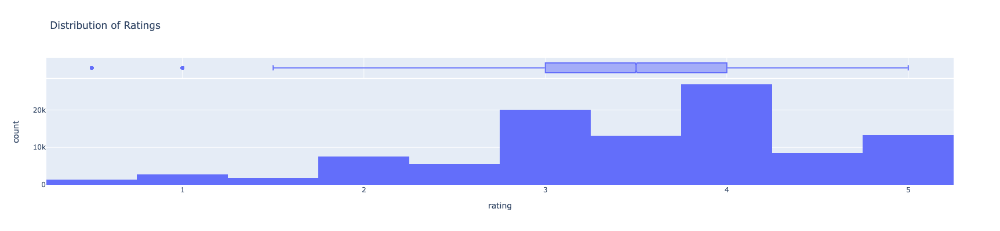

In [36]:
px.histogram(ratings_df, x = 'rating', marginal = 'box', title= 'Distribution of Ratings', height = 400, width = 800)

### Ratings by year movie was made
- Ratings have been going down over time
- Note: if we simply recommend higher rated movies, they will more likely be older movies

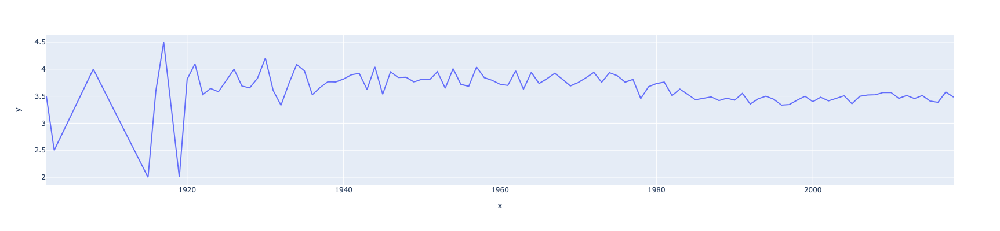

In [29]:
# Merge Dataframes for genres and ratings
merged = pd.merge(movie_df[['year_filmed']], ratings_df[['movieId','rating']], left_on = 'movieId', right_on = 'movieId')

# Group by year filmed and get average rating
ratings_by_year = merged.groupby('year_filmed')['rating'].mean()

# Create Line Plot
px.line(x = ratings_by_year.index, y = ratings_by_year.values, height = 400, width = 800)

### Most common genres:
- Fortunately, most of our movies have at least one associated genre
- Drama and Comedy are the most prevalent

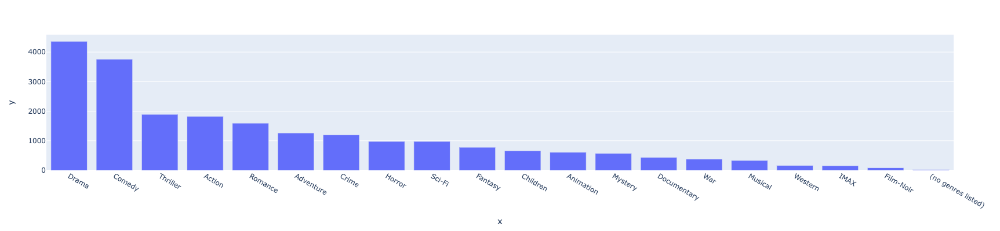

In [30]:
# Use explode to break out the list of genres into new rows, then count the number of frequency of each genre with value counts
common_genres = movie_df.explode('genres')['genres'].value_counts()

# Create bar plot
px.bar(x = common_genres.index, y = common_genres.values, width = 800, height = 400)

### Highest rated genres:
- The genres with the most favorable distributions are:
    - Film-Noir, War, Documentary, Crime, Drama, and Mystery
- 3 other genres have a notably strong negative skew with the bulk of ratings being 4s:
    - Animation, IMAX, and Western
- The rest of the genres look very similar
- Horror and movies without a genre have the widest range of outcomes

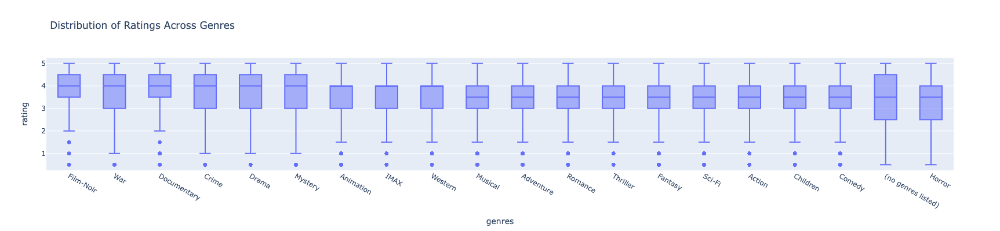

In [37]:
# Merge DataFrames with genres and ratings
merged = pd.merge(movie_df[['genres']], ratings_df[['movieId','rating']], left_on = 'movieId', right_on = 'movieId').explode('genres')

# Specify the order in which we want to display the genres
order = merged.groupby('genres')['rating'].mean().sort_values(ascending=False).keys()

px.box(merged,x='genres',y='rating', category_orders = {'genres': order},title= 'Distribution of Ratings Across Genres', height = 400, width = 1000)

### Ratings Per User
- Most users tend to rate bewteen 20-366 movies, with the median amoutn being 70
- There is bias here, as our sample is that of users with 20+ ratings offered

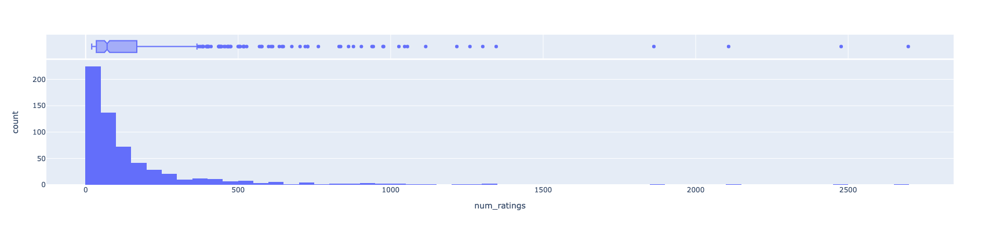

In [32]:
px.histogram(user_df, x = 'num_ratings', marginal = 'box', width = 800, height = 400)

### Ratings Per Movie
- Most movies tend to get between 1 and 20 ratings, with the median sitting around 3
- There is a heavy positive skew to the data

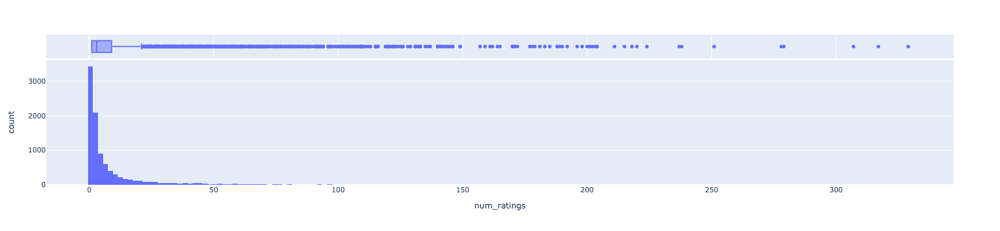

In [33]:
px.histogram(movie_df, x = 'num_ratings', marginal = 'box', width = 800, height = 400)

### Inspect Tag Count:
- Most of the tags are unique to only 1 movie
    - This is not only not useful but counterproductive as it increases dimensionality
- If tags are to be used to compare movies, we should remove movies with only 1 tag

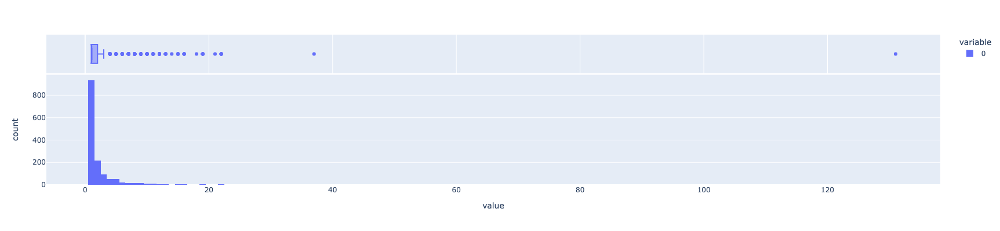

In [34]:
# Inspect Tags
px.histogram(movie_df['tags'].explode().value_counts().values, marginal = 'box', width = 800, height = 400)

### Trending Movies
- Define feature "popularity"
    - Mean normalized rating, scores above the mean score reflect higher popularity, scores below the mean drag it down

In [6]:
# Get data
movie_trends = ratings_df[['movieId','date_rated', 'rating']]

# Mean normalize rating and sort
movie_trends['rating_nrm'] = movie_trends['rating'] - movie_trends['rating'].mean()
movie_trends = movie_trends.sort_values(['movieId','date_rated'])

# Convert date to orginal for regression
movie_trends['date_ordinal'] = movie_trends['date_rated'].map(dt.datetime.toordinal)

# Calculate cumulative popularity
movie_trends['popularity_trend'] = movie_trends.groupby(['movieId'])['rating_nrm'].cumsum()

# Limit to movies with a minimum number of ratings
movie_trends = movie_trends[movie_trends['movieId'].isin(movie_df[movie_df['num_ratings'] >= 75].index)]

# Calculate popularity growth (slope of linear regression between cumulative popularity and date)
movie_trends_grouped = pd.DataFrame()
movie_trends_grouped['popularity_growth'] = movie_trends[movie_trends['date_rated'].dt.year > 2016].groupby('movieId').apply(lambda v: linregress(v.date_ordinal,v.popularity_trend)[0])
movie_trends_grouped = movie_trends_grouped.dropna()

# Sort dataframe
movie_trends_grouped = movie_trends_grouped.sort_values('popularity_growth', ascending=False)

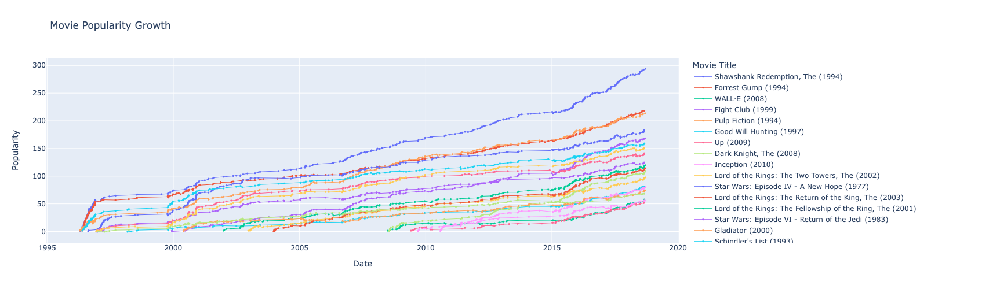

In [35]:
fig = go.Figure()

for movie in movie_trends_grouped.index[:20]:
    
    df_temp = movie_trends[movie_trends['movieId'] == movie]
    
    fig.add_trace(go.Scatter(x = df_temp['date_rated'], 
                             y = df_temp['popularity_trend'],
                             mode='lines+markers',
                             name = movie_df.loc[movie,'title'],
                             marker = dict(size=3),line = dict(width=1)))

    fig.update_layout(
    title = 'Movie Popularity Growth',
    xaxis_title="Date",
    yaxis_title="Popularity",
    legend_title="Movie Title",
    height = 500,
    width = 1000)

fig

# <center> ----------------------------------------------------------------------------------- </center>

# <center> Cold Start </center>

### Problem: 
- To build a SVD model we need ratings from users for movies
- What happens when...
    - A new user subscribes to the platform and we don't have enough preference data for them?
    - A new movie is added to the platform, and we don't have any user ratings for it?
- For users:
    - Until we have 20 ratings from the user, we will only display unpersonalized recommendations 
- For movies:
    - Use features of the new movies to determine similarity with movies with ratings
        - Genre, user tags
    - Surface new movies as "Recently Added" ordered by similarity to popular movies (or movies user is recommended)

# <center> Content Based Filtering for New Movies</center>

### User Tags
- As discovered in EDA, most tags are unique to 1 movie and are not helpful here
- Lets remove tags that are unique to less than 2 movies
    - This step needs to be repeated as more tags are added to the dataset

In [7]:
# Get list of tags we want to keep
tags_to_keep = [tag for tag, count in movie_df['tags'].explode().value_counts().items() if count >= 2][1:]

# Get list of all unique genres
unique_genre_list = movie_df['genres'].explode().value_counts().keys().tolist()

### Create some fake movies to add to our platform

In [8]:
# Create a DataFrame to populate with fake "new movies"
new_movies_df = pd.DataFrame()

# Get the top 8 most popular movies with at least 3 tags, add to DataFrame
new_movies_df = new_movies_df.append(movie_df[movie_df['tags'].apply(lambda x: len(x) > 3)].sort_values('popularity_score',ascending=False).head(8))

# Get the bottom 8 most popular movies with at least 5 tags, add to DataFrame
new_movies_df = new_movies_df.append(movie_df[movie_df['tags'].apply(lambda x: len(x) > 3)].sort_values('popularity_score',ascending=False).tail(8))

# Reset the index to allow for manipulation of the movieId
new_movies_df = new_movies_df.reset_index()

# Alter the title, and movieId to be different
# Make the titles 2025
new_movies_df['title'] = new_movies_df['title'].str.split("(").apply(lambda x: x[0]) + 'Remastered (2025)'

# Make the new movieIds unique
new_movies_df['movieId'] = new_movies_df['movieId'] + 19100000

# Set the index, limit to the proper columns, view results
new_movies_df = new_movies_df.set_index('movieId')
new_movies_df = new_movies_df[['title','genres','tags']]
new_movies_df

,title,genres,tags
movieId,,,
19100318,"Shawshank Redemption, The Remastered (2025)","[Crime, Drama]","[wrongful imprisonment, morgan freeman, prison..."
19100356,Forrest Gump Remastered (2025),"[Comedy, Drama, Romance, War]","[stupid is as stupid does, bittersweet, shrimp..."
19100296,Pulp Fiction Remastered (2025),"[Comedy, Crime, Drama, Thriller]","[original, r:graphic sexuality, aggressive, ba..."
19102571,"Matrix, The Remastered (2025)","[Action, Sci-Fi, Thriller]","[sci-fi, philosophy, post apocalyptic, martial..."
19100593,"Silence of the Lambs, The Remastered (2025)","[Crime, Horror, Thriller]","[gothic, drama, psychology, suspense, disturbi..."
19100260,Star Wars: Episode IV - A New Hope Remastered ...,"[Action, Adventure, Sci-Fi]","[sci-fi, robots and androids, space adventure,..."
19100110,Braveheart Remastered (2025),"[Action, Drama, War]","[beautiful scenery, medieval, scotland, epic, ..."
19102959,Fight Club Remastered (2025),"[Action, Crime, Drama, Thriller]","[thought-provoking, narrated, clever, mind-blo..."
19243367,Silence Remastered (2025),"[Drama, Thriller]","[thought-provoking, philosophical, contemplati..."


### Create a helper function to binarize data for movies  (genres and tags)

In [9]:
def binarize_movies(data_frame, keepers):
    
    '''
    Accepts a dataframe and a list of tags to keep.
    Returns a dataframe with the genres and tags dummied
    '''
    
    genres_dummies = pd.get_dummies(data_frame['genres'].explode()).sum(level=0)
    tags_dummies = pd.get_dummies(data_frame['tags'].explode()).sum(level=0)
    data_frame_dummied = pd.merge(genres_dummies, tags_dummies, left_index = True, right_index= True)

       
    genres_and_tags_to_keep = unique_genre_list + tags_to_keep
    cols_to_keep = [col for col in data_frame_dummied.columns if col in genres_and_tags_to_keep]
    
    return data_frame_dummied[cols_to_keep]

### Create helper function to calculate the Manhattan distance between the movies provided (for similarity)

In [10]:
def calculate_movie_similarity(input_dataframe):
    
    '''
    Accepts a DataFrame and calculates similarity bewteen movies in the dataframe.
    Returns a distance matrix with calculated similarities (Manhattan).
    '''
    
    distance_matrix = pd.DataFrame(index = input_dataframe.index, columns = input_dataframe.index)

    # Loop through DataFrame and calculate distances
    for movie1 in distance_matrix.index[:]:
        for movie2 in distance_matrix.index[:]:
            movie1_features = input_dataframe.loc[movie1,:]
            movie2_features = input_dataframe.loc[movie2,:]
            distance_matrix.loc[movie1, movie2] = distance.cityblock(movie1_features, movie2_features)

    return distance_matrix

### Define a function to make recommendations for new movies based upon their similarity to the movies provided

In [11]:
def make_cold_recommendations(movie_dataframe, new_movies):
    
    '''
    Accepts a two dataframes.
    Dummies both of them, combines them, calculates the similarity of all the movies.
    Returns a list of titles from the new_movies dataframe ordered by the similarity to the first provided dataframe.
    '''
    
    # Dummy and merge the two dataframes
    dummy_movies = binarize_movies(movie_dataframe, tags_to_keep)
    dummy_new_movies = binarize_movies(new_movies, tags_to_keep)
    dummied_all_movies = dummy_movies.append(dummy_new_movies).fillna(0)
    
    # Calculate similarity
    similarity_matrix = calculate_movie_similarity(dummied_all_movies)
    
    # Filter the similarity dataframe
    similarity_matrix_filtered = similarity_matrix.loc[new_movies.index,:].drop(columns = new_movies.index)
    
    # Order the new movies by similarity to the provided dataframe
    most_similar_new_movie_ids = similarity_matrix_filtered.min(axis=1).sort_values().index
    
    return new_movies.loc[most_similar_new_movie_ids,'title'].tolist()

### Test Example:

In [12]:
top_10_movies = movie_df.sort_values('popularity_score',ascending=False).head(10)
make_cold_recommendations(top_10_movies, new_movies_df)

['Shawshank Redemption, The Remastered (2025)',
 'Forrest Gump Remastered (2025)',
 'Pulp Fiction Remastered (2025)',
 'Matrix, The Remastered (2025)',
 'Silence of the Lambs, The Remastered (2025)',
 'Star Wars: Episode IV - A New Hope Remastered (2025)',
 'Braveheart Remastered (2025)',
 'Fight Club Remastered (2025)',
 'Self/less Remastered (2025)',
 'Gintama: The Movie Remastered (2025)',
 'Silence Remastered (2025)',
 'Short Term 12 Remastered (2025)',
 'Who Killed Chea Vichea? Remastered (2025)',
 "Angel's Egg Remastered (2025)",
 'Cat Soup Remastered (2025)',
 'More Remastered (2025)']

# <center> ----------------------------------------------------------------------------------- </center>

# <center> Collaborative Filtering with SVD </center>

In [13]:
from surprise import Reader, Dataset
from surprise import accuracy
from surprise.prediction_algorithms import SVD
from sklearn.model_selection import train_test_split

### Create Utility Matrix

In [14]:
# Get necessary data
df_utility = ratings_df.drop(columns=['date_rated'])

# View DataFrame
df_utility.head()

,userId,movieId,rating
0,1,1,4.0
1,1,3,4.0
2,1,6,4.0
3,1,47,5.0
4,1,50,5.0


### Inspect 

In [15]:
# View number of users and movies
print("Num Users:", df_utility['userId'].nunique())   
print("Num Movies:", df_utility['movieId'].nunique())     

Num Users: 610
Num Movies: 9711


### Split into test/train sets

In [16]:
# Split data in training and test
train_data, test_data = train_test_split(df_utility, test_size = 0.2)
print("Train size:", train_data.shape)   
print("Test size:", test_data.shape)     

Train size: (80654, 3)
Test size: (20164, 3)


### Build Surprise datasets

In [17]:
# Read the data into a Surprise dataset
reader = Reader(rating_scale = (1, 5))
data_train = Dataset.load_from_df(train_data, reader)
data_test = Dataset.load_from_df(test_data, reader)

In [18]:
# Build full trainset
data_train = data_train.build_full_trainset()
data_test = data_test.build_full_trainset()

In [19]:
print('Train rating', data_train.global_mean), 
print('Test rating', data_test.global_mean)

Train rating 3.4998264190244748
Test rating 3.508356476889506


In [20]:
# Create the trainset and testset
data_trainset = data_train.build_testset()
data_testset = data_test.build_testset()

### Create SVD Model

In [21]:
# Create SVD algorithm with n factors
svd_model = SVD(n_factors= 1, random_state = 42)

In [22]:
# Train the algorithm on the trainset
svd_model.fit(data_train)

### Training Accuracy

In [23]:
# Calculate RMSE for training dataset
train_pred = svd_model.test(data_trainset)
accuracy.rmse(train_pred)

RMSE: 0.8260


0.8259919281826489

### Testing Accuracy

In [24]:
# Calculate RMSE for test dataset
test_pred = svd_model.test(data_testset)
accuracy.rmse(test_pred)

RMSE: 0.8637


0.863700332307766

# The Homepage Outline

### Define helper function
- Used to generate "Recommended For You" as well as sorting the other generic recommendations by estimated user preference

In [25]:
def get_ratings(UID, movie_id_list = ratings_df['movieId'].unique()):
    '''
    - Accepts a user ID and a series of movie IDs.
    - Returns the list of movie IDs sorted descending by the estimated rating of the user.
        - If no list is provided the entire list of movieId's will be used.
    '''
    
    recs = {}
    
    for movie_id in movie_id_list:
        recs[movie_id] = svd_model.predict(UID, movie_id)[3]
        
    recs_sorted = {k: v for k, v in sorted(recs.items(), key=lambda item: item[1], reverse= True)}
    recs_sorted_keys = list(recs_sorted.keys())
    
    return recs_sorted_keys

### Homepage Outline Function

In [26]:
def RecommendHomepageOutline(user_id, new_movies = new_movies_df):
    
    '''
    This function accepts a user_id and will return a DataFrame outlining recommendations for the user.
    The recommendations will differ if a user has 20+ ratings or not.
        - If the user has provided 20+ ratings, the recommendations will be personalized
        - If the user has < 20 rating, the recommendations will be generic
    The function also accepts a list of new movies that can be incorporated into the recommendations
    '''
    
    # Create homepage dataframe to populate
    homepage_df = pd.DataFrame(columns = [i for i in range(1,11)])
    
    # Create a dictionary to map movieIds to titles
    id_to_title_dict = dict(zip(movie_df.index, movie_df['title']))
    
    # Create a list to keep track of movies already recommended
    movies_already_recommended = []
            
    # Check if user is in database and has at least 20 ratings
    if user_id in user_df.index:
        if user_df.loc[user_id, 'num_ratings'] >= 20:
            
            # Add the list of movies the user has rated to a list
            movies_already_seen = ratings_df[ratings_df['userId'] == user_id]['movieId'].tolist()
            
            # Get personalized recommendations
            personal_recs = get_ratings(user_id)
            homepage_df.loc['Recommended For You',:] = [id_to_title_dict[i] for i in personal_recs][:10]
    
            # Get best movies of the year
            current_year = movie_df['year_filmed'].max()
            top_10_movies_this_year = movie_df[movie_df['year_filmed'] == current_year].sort_values('popularity_score',ascending= False).index[:200]
            top_10_movies_this_year = [i for i in top_10_movies_this_year if i not in movies_already_seen][:10]
            top_10_movies_this_year = get_ratings(user_id,top_10_movies_this_year)
            movies_already_recommended += top_10_movies_this_year
            homepage_df.loc['Best Movies This Year',:] = [id_to_title_dict[i] for i in top_10_movies_this_year]

            # Get best movies of all time
            top_10_movies = movie_df.sort_values('popularity_score',ascending= False).index[:200]
            top_10_movies = [i for i in top_10_movies if i not in movies_already_seen + movies_already_recommended][:10]
            top_10_movies = get_ratings(user_id,top_10_movies)
            movies_already_recommended += top_10_movies
            homepage_df.loc['Best Movies of All Time',:] = [id_to_title_dict[i] for i in top_10_movies]

            # Get Recently Added Movies         
            top_50_recs = movie_df.loc[get_ratings(user_id)[:50],:]
            recently_added_ordered = make_cold_recommendations(top_50_recs, new_movies_df) 
            homepage_df.loc['Recently Added',:] = recently_added_ordered[:10]

            # Get most controversial of all time
            controversial_movies = movie_df.sort_values('controversial_score', ascending= False).index[:200]
            controversial_movies = [i for i in controversial_movies if i not in movies_already_seen + movies_already_recommended][:10]
            controversial_movies = get_ratings(user_id,controversial_movies)
            movies_already_recommended += controversial_movies
            homepage_df.loc['Love It or Hate It',:] = [id_to_title_dict[i] for i in controversial_movies]

            # Get trendings movies
            trending_movies = movie_trends_grouped.sort_values('popularity_growth',ascending= False).index[:200]
            trending_movies = [i for i in trending_movies if i not in movies_already_seen + movies_already_recommended][:10]
            trending_movies = get_ratings(user_id,trending_movies)
            movies_already_recommended += trending_movies
            homepage_df.loc['Trending',:] = [id_to_title_dict[i] for i in trending_movies]

            # Get top movies in each genre
            for genre in ['Film-Noir','War','Documentary','Crime','Drama','Mystery','Animation']:
                genre_top_10 = movie_df[movie_df['genres'].apply(lambda x: genre in x)].sort_values('popularity_score', ascending= False).index[:200]
                genre_top_10 = [i for i in genre_top_10 if i not in movies_already_seen + movies_already_recommended][:10]
                genre_top_10 = get_ratings(user_id,genre_top_10)
                movies_already_recommended += genre_top_10
                homepage_df.loc[genre,:] = [id_to_title_dict[i] for i in genre_top_10][:10]
            
                      
    else:
    
        # Get best movies of the year
        current_year = movie_df['year_filmed'].max()
        top_10_movies_this_year = movie_df[movie_df['year_filmed'] == current_year].sort_values('popularity_score',ascending= False).index[:10].tolist()
        movies_already_recommended += top_10_movies_this_year
        homepage_df.loc['Best Movies This Year',:] = [id_to_title_dict[i] for i in top_10_movies_this_year]

        # Get best movies of all time
        top_10_movies = movie_df.sort_values('popularity_score',ascending= False).index[:200]
        top_10_movies = [i for i in top_10_movies if i not in movies_already_recommended][:10]
        movies_already_recommended += top_10_movies
        homepage_df.loc['Best Movies of All Time',:] = [id_to_title_dict[i] for i in top_10_movies]

        # Get Recently Added Movies         
        top_50_movies = movie_df.sort_values('popularity_score',ascending=False).head(50)
        recently_added_ordered = make_cold_recommendations(top_50_movies, new_movies_df) 
        homepage_df.loc['Recently Added',:] = recently_added_ordered[:10]

        # Get most controversial of all time
        controversial_movies = movie_df.sort_values('controversial_score', ascending= False).index[:200]
        controversial_movies = [i for i in controversial_movies if i not in movies_already_recommended][:10]
        movies_already_recommended += controversial_movies
        homepage_df.loc['Love It or Hate It',:] = [id_to_title_dict[i] for i in controversial_movies]

        # Get trendings movies
        trending_movies = movie_trends_grouped.sort_values('popularity_growth',ascending= False).index[:200]
        trending_movies = [i for i in trending_movies if i not in movies_already_recommended][:10]
        movies_already_recommended += trending_movies
        homepage_df.loc['Trending',:] = [id_to_title_dict[i] for i in trending_movies]

        # Get top movies in each genre
        for genre in ['Film-Noir','War','Documentary','Crime','Drama','Mystery','Animation']:
            genre_top_10 = movie_df[movie_df['genres'].apply(lambda x: genre in x)].sort_values('popularity_score', ascending= False).index[:200]
            genre_top_10 = [i for i in genre_top_10 if i not in movies_already_recommended][:10]
            movies_already_recommended += genre_top_10
            homepage_df.loc[genre,:] = [id_to_title_dict[i] for i in genre_top_10][:10]
            
    return homepage_df

In [39]:
RecommendHomepageOutline(user_id = 121, new_movies = new_movies_df)

,1,2,3,4,5,6,7,8,9,10
Recommended For You,"Grand Day Out with Wallace and Gromit, A (1989)",Dr. Strangelove or: How I Learned to Stop Worr...,"Shawshank Redemption, The (1994)",Lawrence of Arabia (1962),Blade Runner (1982),Rear Window (1954),"Streetcar Named Desire, A (1951)",Casablanca (1942),"Usual Suspects, The (1995)",There Will Be Blood (2007)
Best Movies This Year,Avengers: Infinity War - Part I (2018),Isle of Dogs (2018),Deadpool 2 (2018),Ant-Man and the Wasp (2018),Solo: A Star Wars Story (2018),Mission: Impossible - Fallout (2018),Annihilation (2018),Incredibles 2 (2018),Tomb Raider (2018),A Quiet Place (2018)
Best Movies of All Time,"Usual Suspects, The (1995)",Fight Club (1999),"Matrix, The (1999)",Star Wars: Episode V - The Empire Strikes Back...,Raiders of the Lost Ark (Indiana Jones and the...,Star Wars: Episode IV - A New Hope (1977),"Silence of the Lambs, The (1991)",American Beauty (1999),Terminator 2: Judgment Day (1991),Jurassic Park (1993)
Recently Added,"Shawshank Redemption, The Remastered (2025)","Matrix, The Remastered (2025)",Fight Club Remastered (2025),Silence Remastered (2025),Who Killed Chea Vichea? Remastered (2025),Short Term 12 Remastered (2025),Angel's Egg Remastered (2025),Self/less Remastered (2025),Braveheart Remastered (2025),Cat Soup Remastered (2025)
Love It or Hate It,"Godfather, The (1972)","Lord of the Rings: The Return of the King, The...","Lord of the Rings: The Two Towers, The (2002)",Gladiator (2000),"Lord of the Rings: The Fellowship of the Ring,...",Star Wars: Episode VI - Return of the Jedi (1983),"Sixth Sense, The (1999)",Aladdin (1992),"Mask, The (1994)",Star Wars: Episode I - The Phantom Menace (1999)
Trending,"Dark Knight, The (2008)",Life Is Beautiful (La Vita è bella) (1997),Up (2009),Good Will Hunting (1997),WALL·E (2008),Inglourious Basterds (2009),Léon: The Professional (a.k.a. The Professiona...,"Prestige, The (2006)",Alien (1979),Inception (2010)
Film-Noir,Sunset Blvd. (a.k.a. Sunset Boulevard) (1950),Chinatown (1974),"Maltese Falcon, The (1941)",L.A. Confidential (1997),Strangers on a Train (1951),"Third Man, The (1949)",Mulholland Drive (2001),Dark City (1998),Sin City (2005),Drive (2011)
War,Dr. Strangelove or: How I Learned to Stop Worr...,Apocalypse Now (1979),Full Metal Jacket (1987),Saving Private Ryan (1998),The Imitation Game (2014),Platoon (1986),"Last Samurai, The (2003)",300 (2007),Blood Diamond (2006),"Patriot, The (2000)"
Documentary,Crumb (1994),Bowling for Columbine (2002),Exit Through the Gift Shop (2010),Roger & Me (1989),Fog of War: Eleven Lessons from the Life of Ro...,Sicko (2007),Super Size Me (2004),Fahrenheit 9/11 (2004),Jackass: The Movie (2002),"March of the Penguins (Marche de l'empereur, L..."
Crime,Goodfellas (1990),"Godfather: Part II, The (1974)",American History X (1998),Reservoir Dogs (1992),Fargo (1996),"Green Mile, The (1999)","Clockwork Orange, A (1971)",Kill Bill: Vol. 1 (2003),Die Hard (1988),Die Hard: With a Vengeance (1995)
